# Start

In [1]:
import os
project_path = '/media/workspace/caoguangshuo/scPlantGPT'
os.chdir(f'{project_path}/s03_scPlantGPT/trainer')

import numpy as np
import sys
import pandas as pd
from torch import nn
sys.path.insert(0, "../")
from Util.utils import set_seed, setup_custom_logger, load_config, log_fig

from flash_attn.bert_padding import unpad_input, pad_input
import os
import pickle
import json
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import LabelEncoder
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
import pickle
import json

In [2]:
from collections import Counter
import igraph as ig
import leidenalg as la
import random
from sklearn.neighbors import kneighbors_graph
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def cluster_umap_embeddings(umap_embeddings, n_neighbors=15, method='leiden', resolution=1.0, random_seed=42):

    if random_seed is not None:
        np.random.seed(random_seed)
        random.seed(random_seed)

    knn_graph = kneighbors_graph(umap_embeddings, n_neighbors=n_neighbors, include_self=False)

    sources, targets = knn_graph.nonzero()
    edges = list(zip(sources, targets))
    G = ig.Graph(edges=edges, directed=False)

    if method == 'louvain':
        partition = G.community_multilevel()
        labels = np.array(partition.membership)
    elif method == 'leiden':
        partition = la.find_partition(G, la.RBConfigurationVertexPartition, resolution_parameter=resolution, seed=random_seed)
        labels = np.array(partition.membership)
    else:
        raise ValueError("Method must be 'louvain' or 'leiden'")

    silhouette_avg = silhouette_score(umap_embeddings, labels)

    plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=labels, cmap='viridis', s=5)
    plt.title(f'UMAP with {method.capitalize()} Clustering')
    plt.colorbar(label='Cluster ID')
    plt.show()

    return labels, silhouette_avg


In [3]:
def assign_labels_to_clusters(clusters, true_labels):
    clusters = np.array(clusters)
    true_labels = np.array(true_labels)

    unique_clusters = np.unique(clusters)

    predicted_labels = np.zeros_like(clusters, dtype=object)

    for cluster in unique_clusters:
        cluster_indices = np.where(clusters == cluster)[0]
        cluster_labels = true_labels[cluster_indices]
        most_common_label = Counter(cluster_labels).most_common(1)[0][0]
        predicted_labels[cluster_indices] = most_common_label
    
    return predicted_labels


In [4]:
def create_celltype_color_mapping(celltype_vocab, nature_colors):
    celltype_color_mapping = {}
    
    for idx, (key, celltype) in enumerate(celltype_vocab.items()):
        color = nature_colors[idx % len(nature_colors)]
        celltype_color_mapping[celltype] = color
    
    return celltype_color_mapping


In [5]:
nature_colors = ['#E64B35', '#4DBBD5', '#00A087', '#3C5488', '#F39B7F',         
                '#8491B4', '#91D1C2', '#DC0000', '#7E6148', '#B09C85',
                '#F7CAC9', '#FE840E', '#FFD700', '#536878', '#996515', 
                 '#804041', '#2F4F4F','#4B0082', '#191970', '#FF00FF', 
                 '#BA55D3', '#9370DB', '#8A2BE2', '#A52A2A', '#DEB887',
                 '#5F9EA0', '#7FFF00', '#D2691E', '#FF7F50', '#6495ED', 
                 '#FFF8DC', '#DC143C', '#00FFFF', '#00008B', '#008B8B', 
                 '#B8860B',  '#006400', '#8B008B', '#556B2F', '#FF8C00',
                 '#9932CC', '#8B0000', '#E9967A', '#8FBC8F', '#483D8B',
                 '#2F4F4F', '#00CED1', '#9400D3', '#FF1493', '#00BFFF',
                 '#1E90FF', '#B22222', '#228B22', '#FFD700']

In [6]:

ara_celltype_vocab_path =f'{project_path}/s03_scPlantGPT/cross_data/Ara_celltype_record_clean_vocab.meta.json'
with open(ara_celltype_vocab_path) as f:
        ara_celltype_vocab = json.load(f)
ara_celltype_vocab = {value : key for key, value in ara_celltype_vocab.items()} 

celltype_color_mapping = create_celltype_color_mapping(ara_celltype_vocab, nature_colors)

result_path = f'{project_path}/s03_scPlantGPT/result/clean_label/scAraGPT'
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result'

In [7]:
def create_celltype_color_mapping(celltype_vocab, nature_colors):
    celltype_color_mapping = {}

    for idx, (key, celltype) in enumerate(celltype_vocab.items()):
        color = nature_colors[idx % len(nature_colors)]
        celltype_color_mapping[celltype] = color
    
    return celltype_color_mapping

celltype_color_mapping = create_celltype_color_mapping(ara_celltype_vocab, nature_colors)
print(celltype_color_mapping)


{'Mesophyll': '#E64B35', 'Leaf pavement cell': '#4DBBD5', 'Companion cell': '#00A087', 'Xylem': '#3C5488', 'Leaf guard cell': '#F39B7F', 'Phloem parenchyma': '#8491B4', 'Shoot apical meristem': '#91D1C2', 'Shoot system epidermis': '#DC0000', 'Guard cell': '#7E6148', 'Sieve element': '#B09C85', 'Hydathodes': '#F7CAC9', 'Phloem': '#FE840E', 'Lateral root cap': '#FFD700', 'Root cortex': '#536878', 'Root endodermis': '#996515', 'Root cap': '#804041', 'Non-hair': '#2F4F4F', 'Root hair': '#4B0082', 'Columella root cap': '#191970', 'Root procambium': '#FF00FF', 'Xylem pole pericycle': '#BA55D3', 'Phloem pole pericycle': '#9370DB', 'Protoxylem': '#8A2BE2', 'Metaxylem': '#A52A2A', 'Root stele': '#DEB887', 'Pericycle': '#5F9EA0', 'Meristematic cell': '#7FFF00', 'Stem cell niche': '#D2691E', 'Root epidermis': '#FF7F50', 'Phloem/Pericycle': '#6495ED', 'Spongy mesophyll': '#FFF8DC', 'Palisade mesophyll': '#DC143C', 'Bundle sheath': '#00FFFF', 'Leaf epidermis': '#00008B', 'Explant vasculature and ca

In [8]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_cm(cell_types_predictions, cell_types_labels, celltype_vocab, save_name, threshold=0.10, onlyTrueLabels=True):


    cell_types_labels = np.array(cell_types_labels, dtype=int)
    cell_types_predictions = np.array(cell_types_predictions, dtype=int)

    all_labels = np.union1d(cell_types_labels, cell_types_predictions)


    cm = confusion_matrix(cell_types_labels, cell_types_predictions, labels=all_labels)
    cm_df = pd.DataFrame(cm, index=all_labels, columns=all_labels)

    cm_np = cm_df.to_numpy().astype('float')


    accuracy_matrix = cm_np / cm_np.sum(axis=1, keepdims=True)


    accuracy_df = pd.DataFrame(accuracy_matrix, index=all_labels, columns=all_labels)

    if onlyTrueLabels:
        true_labels = np.unique(cell_types_labels)
    else:
        true_labels = all_labels
    remaining_labels = [label for label in all_labels if label not in true_labels]
    ordered_labels = list(true_labels) + remaining_labels

    accuracy_df = accuracy_df[ordered_labels]

    filtered_df = accuracy_df.loc[:, (accuracy_df > threshold).any(axis=0)]


    for i, label in enumerate(true_labels):
        if label in filtered_df.index:
            max_col = filtered_df.loc[label].idxmax()
            max_idx = filtered_df.columns.get_loc(max_col)

            if max_idx > i:
                cols = list(filtered_df.columns)

                cols[i], cols[max_idx] = cols[max_idx], cols[i]
                filtered_df = filtered_df[cols]

    label_count = len(filtered_df.columns)
    figsize = (label_count * 0.5, len(true_labels) * 0.5)


    plt.figure(figsize=figsize)
    sns.heatmap(filtered_df.loc[true_labels], annot=True, fmt='.2f', cmap='Blues', cbar=False, annot_kws={"size": 10})

    plt.xlabel('Predicted Cell Type')
    plt.ylabel('Annotated Cell Type')


    filtered_labels_names = [celltype_vocab[idx] for idx in filtered_df.columns]
    filtered_true_labels_names = [celltype_vocab[idx] for idx in true_labels if idx in filtered_df.index]

    plt.xticks(np.arange(len(filtered_df.columns)) + 0.5, filtered_labels_names, rotation=45, ha='right')
    plt.yticks(np.arange(len(filtered_true_labels_names)) + 0.5, filtered_true_labels_names, rotation=0)

    plt.savefig(f"{save_name}.pdf", dpi=300, format='pdf', bbox_inches='tight')
    plt.show()


In [9]:
def draw_umap(embedding, cell_types, vocab, color_mapping, title, method='t-SNE', save_name=None, label_clusters=False):  
    
    point_size = 120000 / embedding.shape[0] 

    if not color_mapping:
        raise ValueError("color_mapping cannot be empty or None")

    cell_colors = [color_mapping.get(vocab.get(cell_type, cell_type), '#000000') for cell_type in cell_types]  # 默认颜色为黑色


    label_encoder = LabelEncoder()
    cell_types_encoded = label_encoder.fit_transform(cell_types)
    
    custom_cmap = ListedColormap([color_mapping.get(vocab.get(label, label), '#000000') for label in label_encoder.classes_])

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=cell_types_encoded, cmap=custom_cmap, s=point_size)
    
    plt.xlabel(f'{method} 1')
    plt.ylabel(f'{method} 2')
    
    unique_cell_types = label_encoder.classes_
    if vocab:
        handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=8, markerfacecolor=color_mapping.get(vocab.get(unique_cell_types[i], f'Cell Type {unique_cell_types[i]}'), '#000000'), label=vocab.get(unique_cell_types[i], f'Cell Type {unique_cell_types[i]}')) for i in range(len(unique_cell_types))]
    else:
        handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=8, markerfacecolor=color_mapping.get(unique_cell_types[i], '#000000'), label=f'Cluster {unique_cell_types[i]}') for i in range(len(unique_cell_types))]
    
    num_columns = 1 if len(unique_cell_types) <= 40 else (len(unique_cell_types) // 40 + 1)
    plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), ncol=num_columns)
    
    if label_clusters:
        for cell_type in unique_cell_types:
            mask = np.array(cell_types) == cell_type
            centroid = np.mean(embedding[mask], axis=0)
            plt.annotate(cell_type, centroid, fontsize=14, weight='bold', ha='center', va='center')
    
    plt.grid(False)
    if save_name:
        plt.savefig(f"{save_name}.pdf", dpi=300, format="pdf", bbox_inches='tight')
        print(f"save at {save_name}")
    plt.show()
    

    if save_name:
        fig_legend = plt.figure(figsize=(3, 2))
        plt.legend(handles=handles, loc='center', frameon=False)
        plt.axis('off')
        plt.savefig(f"{save_name}_legend.pdf", dpi=300, format='pdf', bbox_inches='tight')
        print(f"Legend saved at {save_name}_legend.pdf")
        plt.close(fig_legend)
    
    if save_name:
        fig_legend = plt.figure(figsize=(10, 10))
        ax = fig_legend.add_subplot(111)
        ax.axis('off')
        legend = ax.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), ncol=num_columns)
        fig_legend.canvas.draw()
        bbox = legend.get_window_extent().transformed(fig_legend.dpi_scale_trans.inverted())
        fig_legend.savefig(f"{save_name}_figure_legend.pdf", format='pdf', dpi=300, bbox_inches=bbox)
        print(f"Legend saved at {save_name}_legend.pdf")
        plt.close(fig_legend)


In [10]:

from matplotlib.colors import ListedColormap
from sklearn.preprocessing import LabelEncoder

def draw_cluster(embedding, clusters, title, method='t-SNE', save_name=None, label_clusters=False):  
    
    point_size = 120000 / embedding.shape[0]  # Scanpy is automatically computed as 120000 / n_cells
    nature_colors = ['#E64B35', '#4DBBD5', '#00A087', '#3C5488', '#F39B7F',         
                     '#8491B4', '#91D1C2', '#DC0000', '#7E6148', '#B09C85',
                     '#F7CAC9', '#FE840E', '#FFD700', '#536878', '#996515', '#804041', '#2F4F4F',
                     '#4B0082', '#191970', '#FF00FF', '#BA55D3', '#9370DB', '#8A2BE2', '#A52A2A', '#DEB887', '#5F9EA0', '#7FFF00',
                     '#D2691E', '#FF7F50', '#6495ED', '#FFF8DC', '#DC143C', '#00FFFF', '#00008B', '#008B8B', '#B8860B', 
                     '#006400', '#8B008B', '#556B2F', '#FF8C00', '#9932CC', '#8B0000', '#E9967A', '#8FBC8F', '#483D8B',
                     '#2F4F4F', '#00CED1', '#9400D3', '#FF1493', '#00BFFF', '#1E90FF', '#B22222', '#228B22', '#FFD700']
    
    label_encoder = LabelEncoder()
    clusters_encoded = label_encoder.fit_transform(clusters)
    
    custom_cmap = ListedColormap(nature_colors * (len(np.unique(clusters)) // len(nature_colors) + 1))

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(embedding[:, 0], embedding[:, 1], c=clusters_encoded, cmap=custom_cmap, s=point_size)
    
    plt.xlabel(f'{method} 1')
    plt.ylabel(f'{method} 2')
    plt.title(title)
    

    unique_clusters = label_encoder.classes_
    handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=8, markerfacecolor=nature_colors[i % len(nature_colors)], label=f'Cluster {unique_clusters[i]}') for i in range(len(unique_clusters))]
    
    num_columns = 1 if len(unique_clusters) <= 40 else (len(unique_clusters) // 40 + 1)
    plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), ncol=num_columns)
    
    if label_clusters:

        for cluster in unique_clusters:
            mask = np.array(clusters) == cluster
            centroid = np.mean(embedding[mask], axis=0)
            plt.annotate(cluster, centroid, fontsize=14, weight='bold', ha='center', va='center')
    
    plt.grid(False)
    if save_name:
        plt.savefig(f"{save_name}.pdf", dpi=300, format="pdf", bbox_inches='tight')
        print(f"save at {save_name}")
    plt.show()
    

    if save_name:
        fig_legend = plt.figure(figsize=(3, 2))
        plt.legend(handles=handles, loc='center', frameon=False)
        plt.axis('off')
        plt.savefig(f"{save_name}_legend.pdf", dpi=300, format='pdf', bbox_inches='tight')
        print(f"Legend saved at {save_name}_legend.pdf")
        plt.close(fig_legend)
    
    if save_name:
        fig_legend = plt.figure(figsize=(10, 10))
        ax = fig_legend.add_subplot(111)
        ax.axis('off')
        legend = ax.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), ncol=num_columns)
        fig_legend.canvas.draw()
        bbox = legend.get_window_extent().transformed(fig_legend.dpi_scale_trans.inverted())
        fig_legend.savefig(f"{save_name}_figure_legend.pdf", format='pdf', dpi=300, bbox_inches=bbox)
        print(f"Legend saved at {save_name}_legend.pdf")
        plt.close(fig_legend)


In [11]:
def calculate_accuracy(df, label_column='cell_types_labels', prediction_column='cluster_annotation_label'):

    labels = df[label_column].to_numpy()
    predictions = df[prediction_column].to_numpy()

    matches = (labels == predictions)

    accuracy = np.mean(matches)

    return accuracy


In [12]:
batch_effect_vocab_file = f'{project_path}/s03_scPlantGPT/cross_data/Ara_batch_effect_vocab.meta.json'
with open(batch_effect_vocab_file) as f:
        batch_effect_vocab = json.load(f)
batch_effect_vocab  = {value : key for key, value in batch_effect_vocab.items()} 
batch_color_mapping = create_celltype_color_mapping(batch_effect_vocab, nature_colors)

## 100W cell

In [13]:

ara_celltype_vocab_path =f'{project_path}/s03_scPlantGPT/cross_data/Ara_celltype_record_clean_vocab.meta.json'
with open(ara_celltype_vocab_path) as f:
        ara_celltype_vocab = json.load(f)
ara_celltype_vocab = {value : key for key, value in ara_celltype_vocab.items()} 

celltype_color_mapping = create_celltype_color_mapping(ara_celltype_vocab, nature_colors)

result_path = f'{project_path}/s03_scPlantGPT/result/clean_label/scAraGPT'
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result'

In [14]:
## 100W
with open(f'{result_path}/Ara_train/Ara/tsne_embeddings_finetune_False_Ara.pkl', 'rb') as f:
    tsne_embeddings = pickle.load(f)

result_df = pd.read_csv(f"{result_path}/Ara_train/Ara/Ara_finetune_False_predict_results_best_model_category_8_2024Y08M18D12H54M09S.pth.csv")

In [15]:
tsne_embeddings.shape

(1048064, 2)

In [16]:
len(result_df['cell_types_labels'].unique())

43

save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/100W_celltype_embedding_Tsne


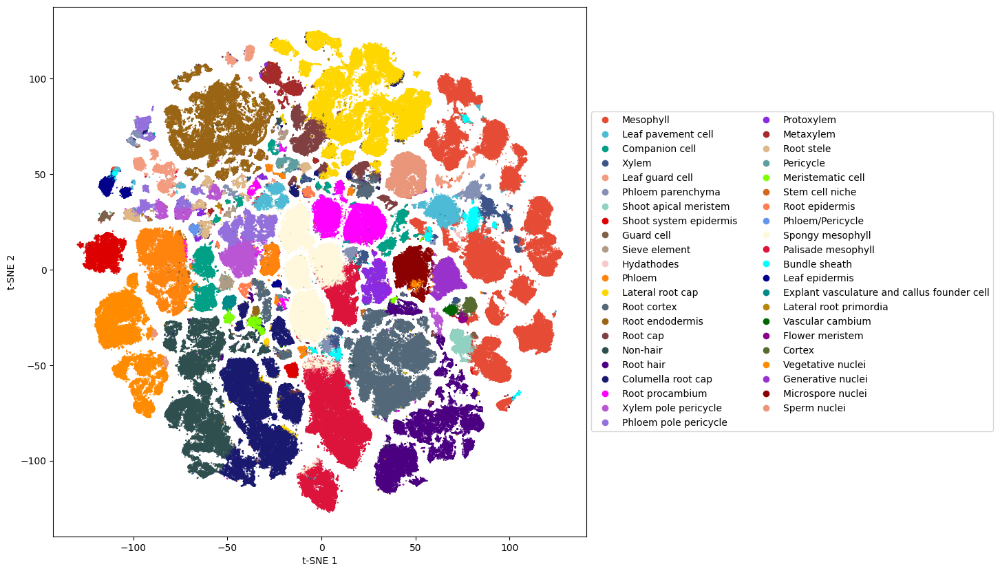

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/100W_celltype_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/100W_celltype_embedding_Tsne_legend.pdf


In [17]:
draw_umap(tsne_embeddings,  result_df['cell_types_predictions'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/100W_celltype_embedding_Tsne", label_clusters=False)

save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/100W_batch_Tsne


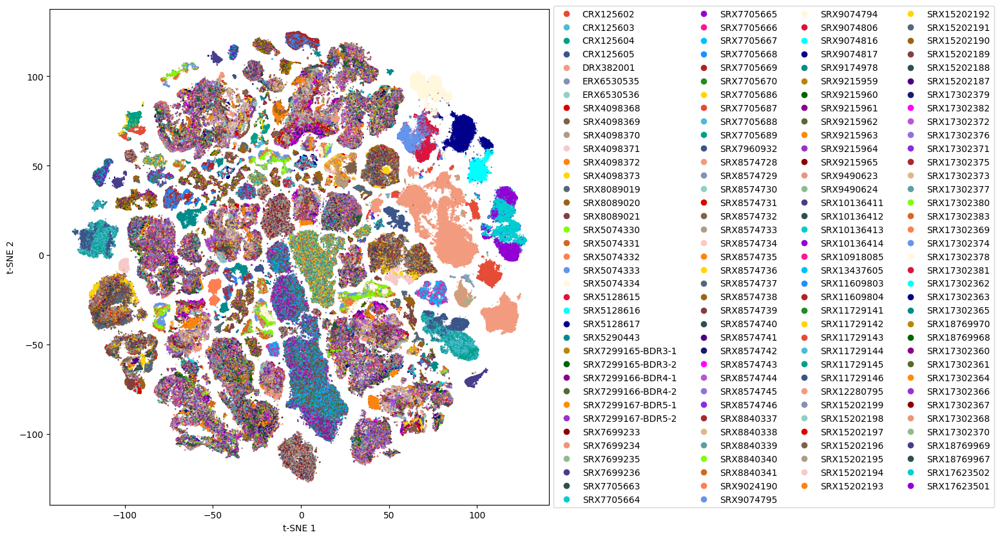

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/100W_batch_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/100W_batch_Tsne_legend.pdf


In [18]:
draw_umap(tsne_embeddings,  result_df['batch_labels'], batch_effect_vocab, batch_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/100W_batch_Tsne", label_clusters=False)

In [19]:
def check_dir(directory_path):
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
        print(f"Directory created: {directory_path}")
    else:
        print(f"Directory already exists: {directory_path}")


In [32]:
def draw_result(tsne_embeddings,  result_df, ara_celltype_vocab, celltype_color_mapping, batch_effect_vocab, batch_color_mapping, save_path):
    check_dir(save_path)

    
    draw_umap(tsne_embeddings,  result_df['cell_types_labels'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/celltype_label_embedding_Tsne", label_clusters=False)

    # draw_umap(tsne_embeddings,  result_df['cell_types_predictions'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/celltype_predict_embedding_Tsne", label_clusters=False)

    draw_cluster(tsne_embeddings,  result_df['leiden_labels'], 'T-SNE', method='t-SNE', save_name=f"{save_path}/leiden_labels_embedding_Tsne", label_clusters=False)

    draw_umap(tsne_embeddings,  result_df['cluster_annotation_label'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/celltype_cluster_annotation_predict_embedding_Tsne", label_clusters=False)

    draw_umap(tsne_embeddings,  result_df['batch_labels'], batch_effect_vocab, batch_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/batch_Tsne", label_clusters=False)
    
    plot_cm(result_df['cluster_annotation_label'], result_df['cell_types_labels'], ara_celltype_vocab, os.path.join(save_path, f'confusion_matrix_after_leiden_Ara_test'), threshold=0)
    
    result_df.to_csv(f'{save_path}/result_df.csv', index=False)
    

In [33]:
def cal_cluster(result_df, tsne_embeddings,resolution=0.8, random_seed=42):
    labels, silhouette_avg = cluster_umap_embeddings(tsne_embeddings, n_neighbors=20, method='leiden', resolution=resolution, random_seed=random_seed)
    result_df['leiden_labels'] = labels

    cluster_annotation_label = assign_labels_to_clusters(result_df['leiden_labels'], result_df['cell_types_predictions'])
    result_df['cluster_annotation_label'] = cluster_annotation_label
    return result_df
    

In [34]:
def draw_seurat_result(rpca_umap_embedding,  result_df, ara_celltype_vocab, celltype_color_mapping, batch_effect_vocab, batch_color_mapping, save_path):
    check_dir(save_path)
    result_df = result_df.merge(rpca_umap_embedding, on='cell_names', how='left')

    tsne_embeddings = result_df[['tSNE_1', 'tSNE_2']].to_numpy()
    
    draw_umap(tsne_embeddings,  result_df['cell_types_labels'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/celltype_label_embedding_Tsne", label_clusters=False)

    # draw_umap(tsne_embeddings,  result_df['cell_types_predictions'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/celltype_predict_embedding_Tsne", label_clusters=False)

    draw_cluster(tsne_embeddings,  result_df['leiden_labels'], 'T-SNE', method='t-SNE', save_name=f"{save_path}/leiden_labels_embedding_Tsne", label_clusters=False)

    draw_umap(tsne_embeddings,  result_df['cluster_annotation_label'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/celltype_cluster_annotation_predict_embedding_Tsne", label_clusters=False)

    draw_umap(tsne_embeddings,  result_df['batch_labels'], batch_effect_vocab, batch_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/batch_Tsne", label_clusters=False)
    
    plot_cm(result_df['cluster_annotation_label'], result_df['cell_types_labels'], ara_celltype_vocab, os.path.join(save_path, f'confusion_matrix_after_leiden_Ara_test'))
    
    result_df.to_csv(f'{save_path}/result_df.csv', index=False)

In [35]:
result_path = f'{project_path}/s03_scPlantGPT/result/clean_label/scAraGPT'

##  Ara Read embedding and result df

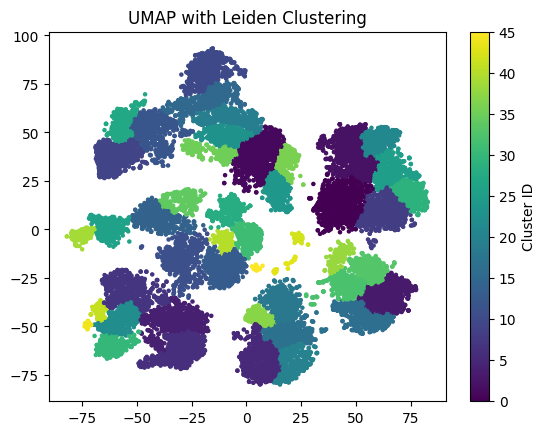

In [24]:
with open(f'{result_path}/Ara_test/Ara/tsne_embeddings_finetune_False_Ara.pkl', 'rb') as f:
    ara_test_unfinetune_tsne_embeddings = pickle.load(f)
with open(f'{result_path}/Ara_test/Ara/umap_embeddings_finetune_False_Ara.pkl', 'rb') as f:
    ara_test_unfinetune_umap_embeddings = pickle.load(f)
    
ara_test_unfinetune_result_df = pd.read_csv(f"{result_path}/Ara_test/Ara/Ara_finetune_False_predict_results_best_model_category_8_2024Y08M18D12H54M09S.pth.csv")
ara_test_unfinetune_result_df = cal_cluster(ara_test_unfinetune_result_df, ara_test_unfinetune_tsne_embeddings)

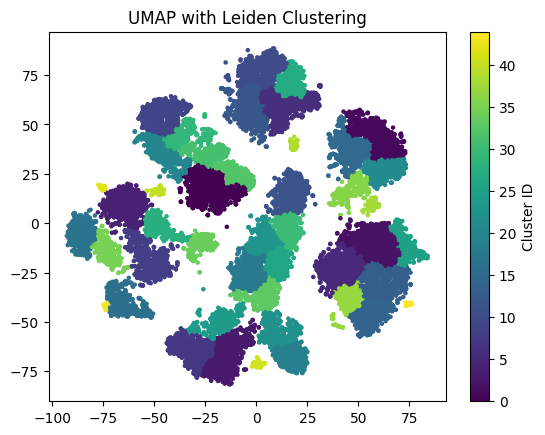

In [25]:
with open(f'{result_path}/Ara_test/Ara/tsne_embeddings_finetune_True_Ara.pkl', 'rb') as f:
    ara_test_finetune_tsne_embeddings = pickle.load(f)
with open(f'{result_path}/Ara_test/Ara/umap_embeddings_finetune_True_Ara.pkl', 'rb') as f:
    ara_test_finetune_umap_embeddings = pickle.load(f)
ara_test_finetune_result_df = pd.read_csv(f"{result_path}/Ara_test/Ara/Ara_finetune_True_predict_results_best_model_category_8_2024Y08M18D12H54M09S.pth.csv")
ara_test_finetune_result_df = cal_cluster(ara_test_finetune_result_df, ara_test_finetune_tsne_embeddings,resolution=0.8, random_seed=42)

In [26]:
## Seurat embedding

In [27]:
rpca_umap_embedding = pd.read_csv(f'/media/workspace/caoguangshuo/scPlantGPT/s02.data_process/test_rds/WholeRoot/tsne_seurat_rpca_embeddings.csv')
rpca_umap_embedding.rename(columns={'Unnamed: 0': 'cell_names'}, inplace=True)
rpca_umap_embedding

,cell_names,tSNE_1,tSNE_2
0,SRX5025979@@_GCGCTGCGCACC,-7.547930,-22.337764
1,SRX5025979@@_TTCGTAAAGGCC,13.832381,-23.870175
2,SRX5025979@@_TTACATAGGGTG,-31.979667,13.441836
3,SRX5025979@@_GCGGCAGATTAC,20.576891,2.410257
4,SRX5025979@@_ATGCGCCGGACA,35.044024,-7.644926
...,...,...,...
35660,SRX5025988@@_TCTGCAACTGGG,36.171635,7.787002
35661,SRX5025988@@_CATAAGGGCCGC,-11.353555,-35.608030
35662,SRX5025988@@_GGGATAGTAGCG,3.239754,31.572530
35663,SRX5025988@@_CCCGGCAACCGC,-19.685467,24.126989


In [28]:
ara_test_finetune_result_df

,cell_types_predictions,cell_types_labels,cell_names,batch_labels,leiden_labels,cluster_annotation_label
0,3,3,SRX5025988@@_GCGGTCTGATTA,25,16,3
1,16,16,SRX5025979@@_AAAGAAACCTCG,16,1,16
2,12,12,SRX5025980@@_AAGCCGGTCTTA,17,7,12
3,12,12,SRX5025980@@_GCACTTGGGCGT,17,3,12
4,24,24,SRX5025982@@_GTCGTGGACATA,19,4,24
...,...,...,...,...,...,...
22779,13,13,SRX5025986@@_CGAGTTCTCTCT,23,10,13
22780,12,12,SRX5025981@@_GTCTGGCCTGGC,18,3,12
22781,12,18,SRX5025981@@_GTTATGCTAATT,18,22,12
22782,18,12,SRX5025985@@_CGATTGGCTAGC,22,22,12


# Ara_test unfinetuned 

## Ara_test unfinetuned unfinetuned_embedding

Directory already exists: /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/celltype_label_embedding_Tsne


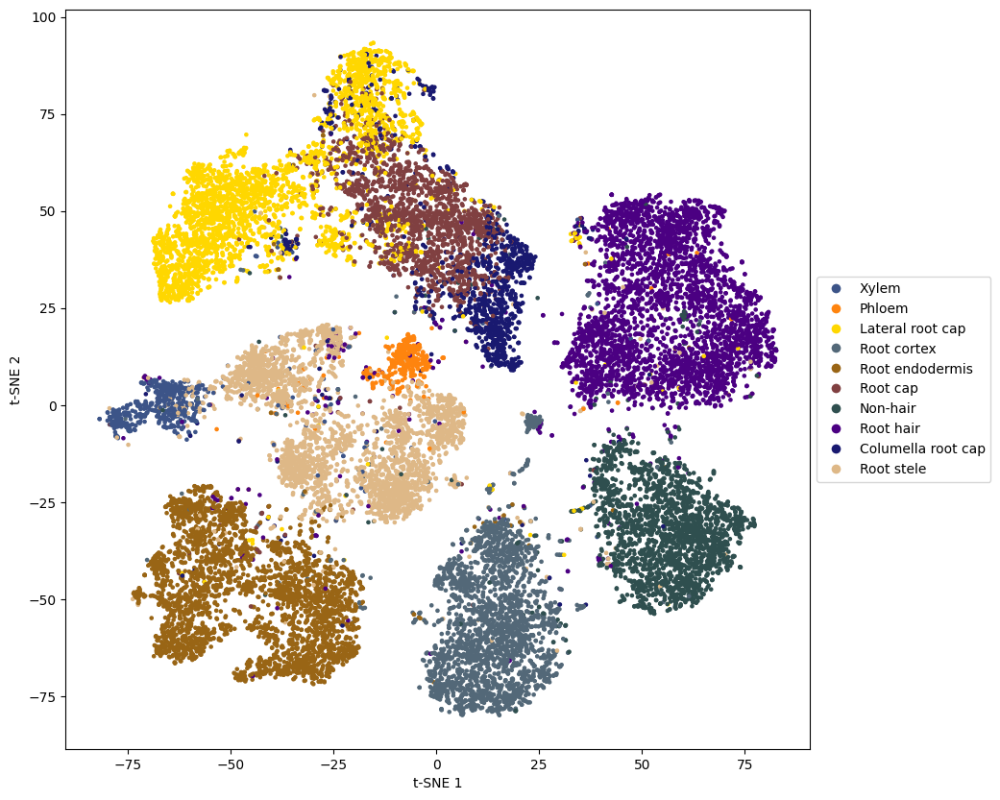

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/celltype_label_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/celltype_label_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/leiden_labels_embedding_Tsne


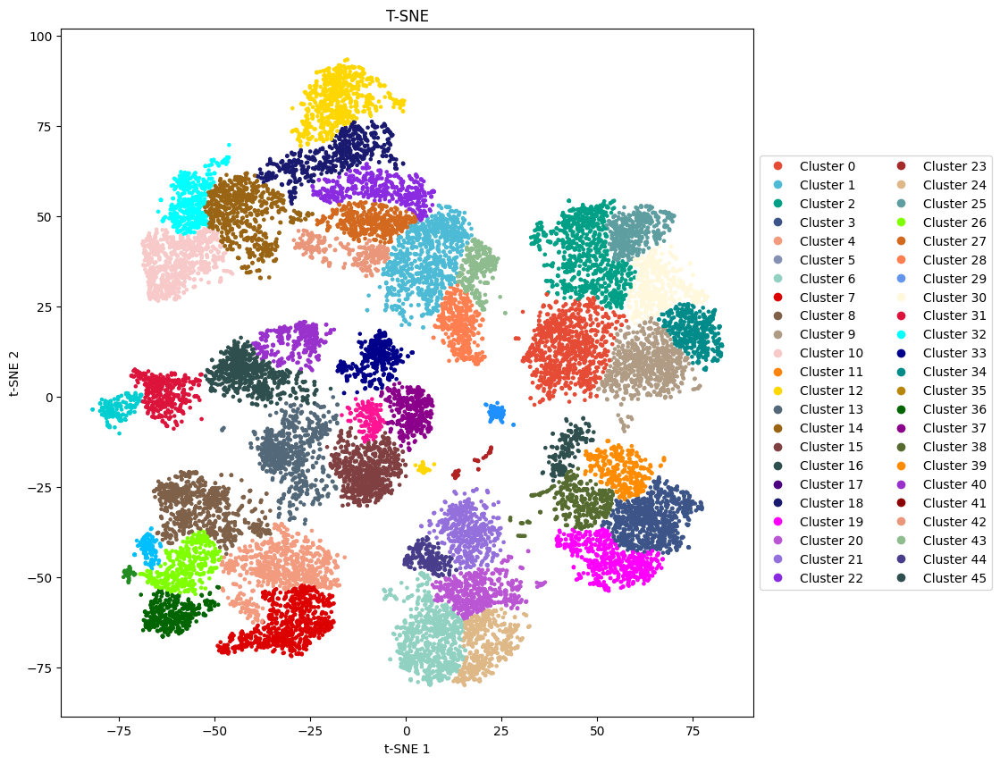

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/leiden_labels_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/leiden_labels_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/celltype_cluster_annotation_predict_embedding_Tsne


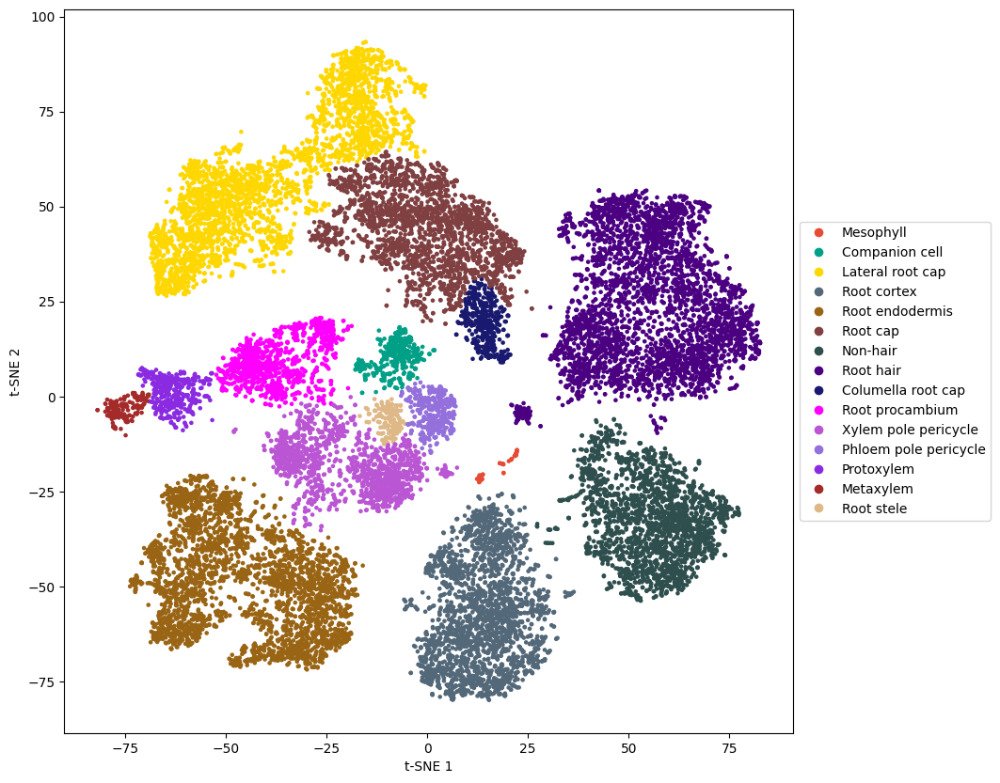

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/batch_Tsne


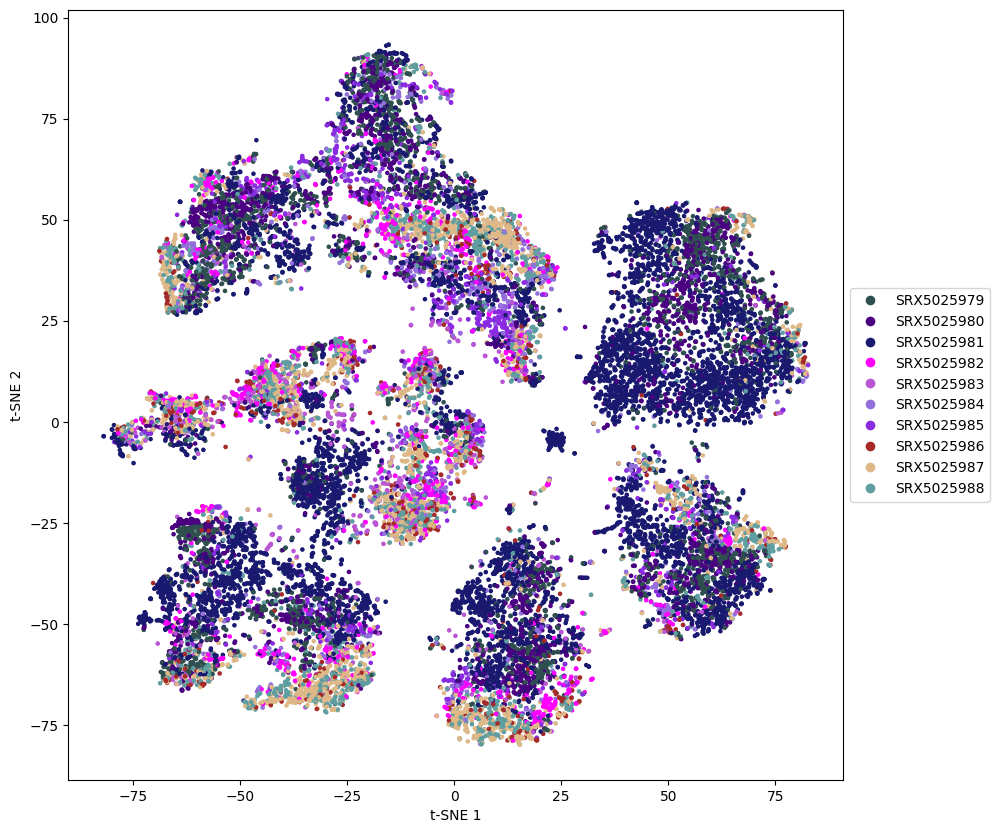

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/batch_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test/batch_Tsne_legend.pdf


/tmp/ipykernel_4430/83900079.py:22: RuntimeWarning: invalid value encountered in divide
  accuracy_matrix = cm_np / cm_np.sum(axis=1, keepdims=True)


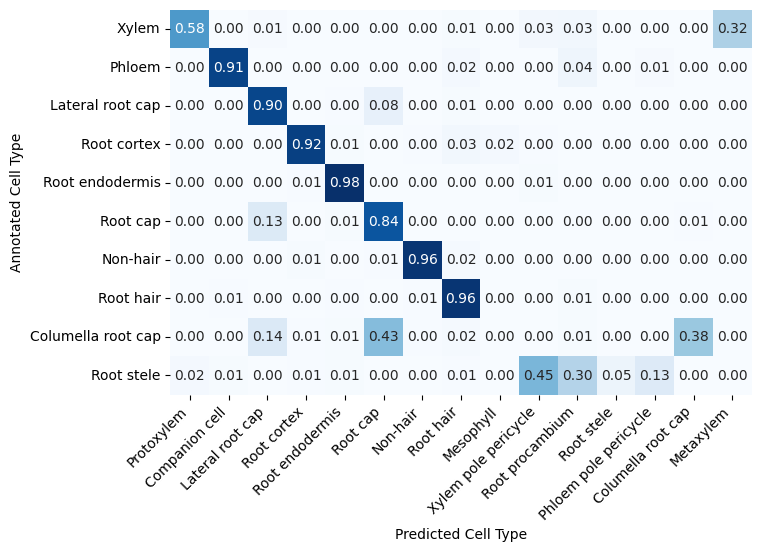

In [36]:
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_test'
draw_result(ara_test_unfinetune_tsne_embeddings, ara_test_unfinetune_result_df, ara_celltype_vocab, celltype_color_mapping, batch_effect_vocab, batch_color_mapping, save_path)

## Ara_test unfinetuned finetuned_embedding

Directory already exists: /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/celltype_label_embedding_Tsne


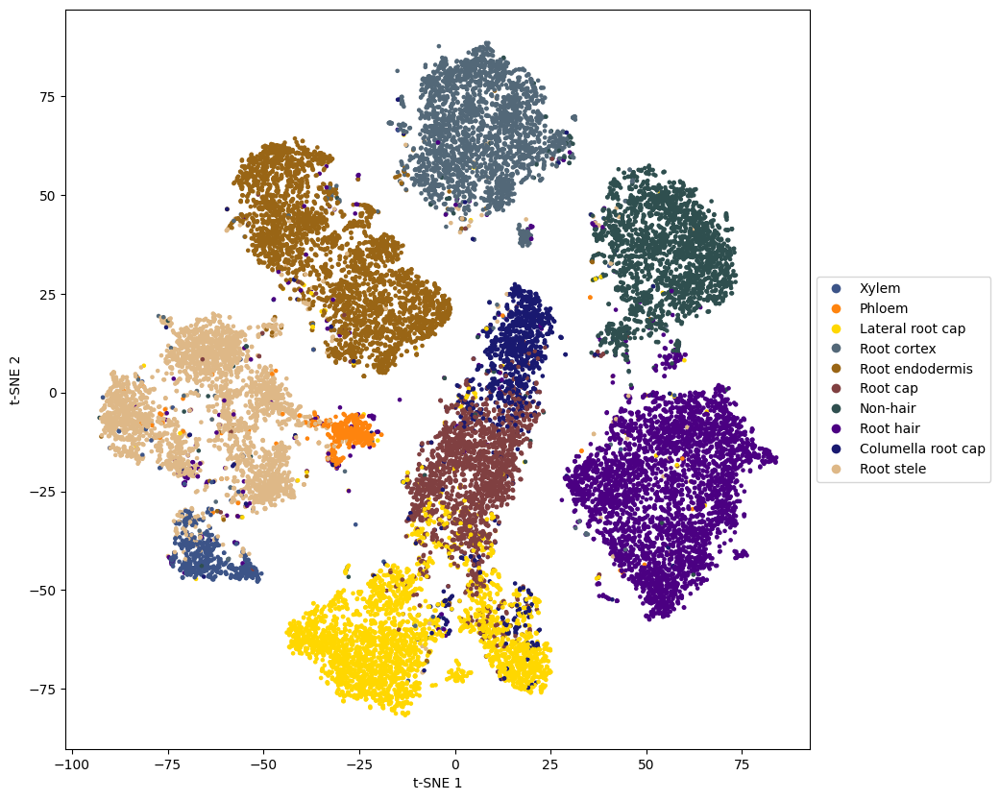

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/celltype_label_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/celltype_label_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/leiden_labels_embedding_Tsne


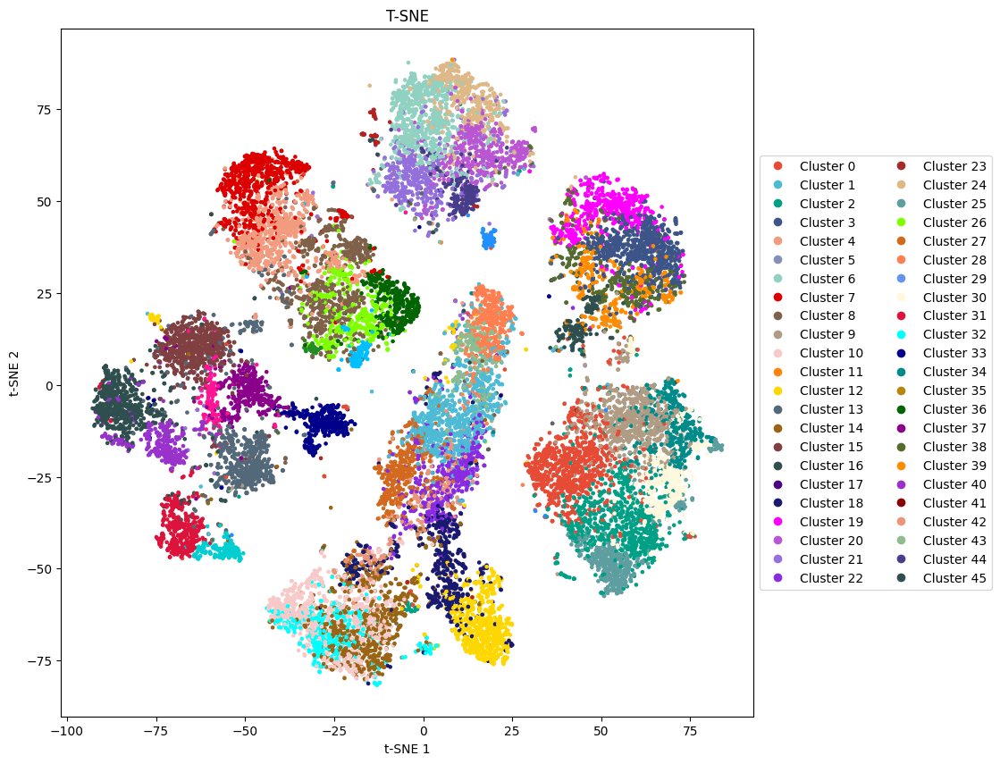

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/leiden_labels_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/leiden_labels_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne


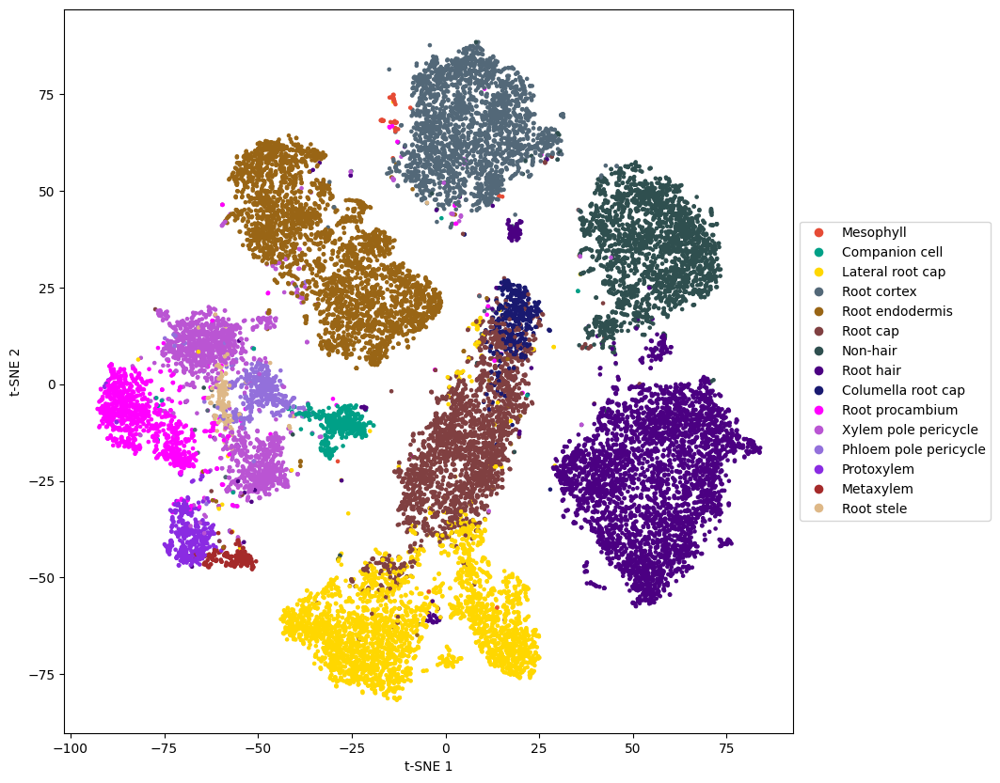

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/batch_Tsne


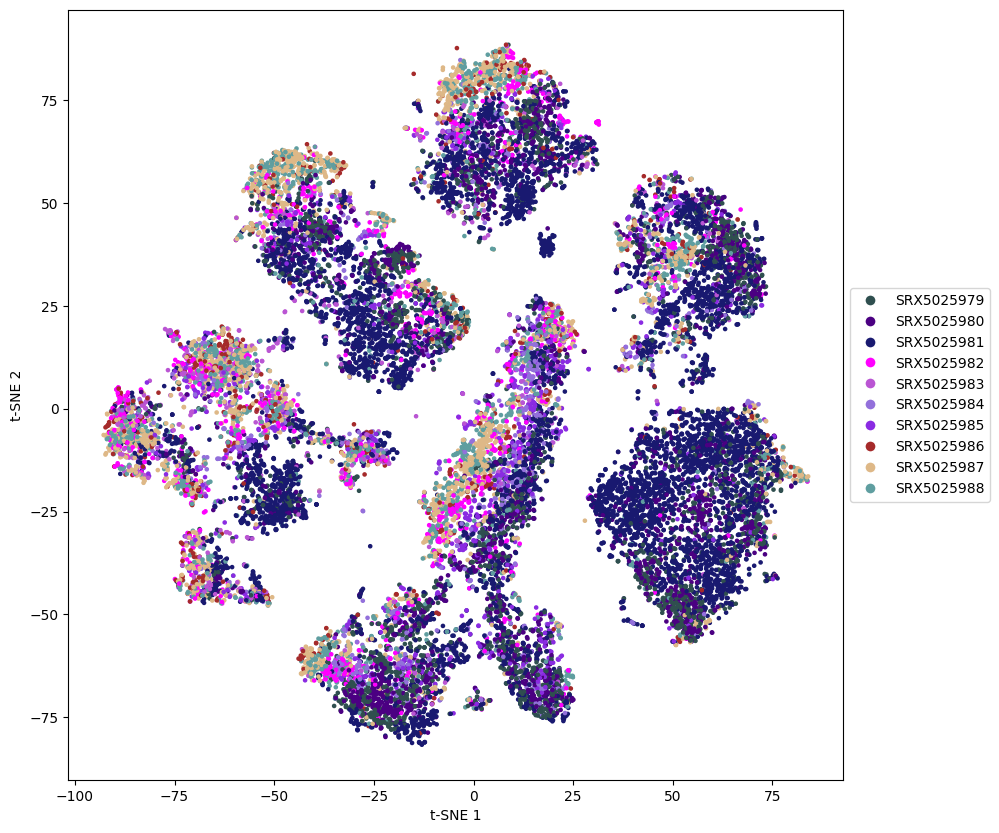

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/batch_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding/batch_Tsne_legend.pdf


/tmp/ipykernel_4430/83900079.py:22: RuntimeWarning: invalid value encountered in divide
  accuracy_matrix = cm_np / cm_np.sum(axis=1, keepdims=True)


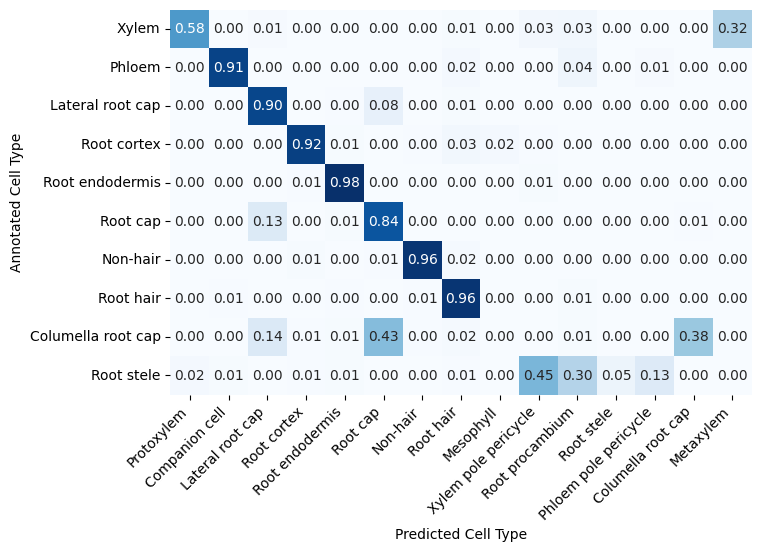

In [37]:
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune_use_finetuned_embedding'
draw_result(ara_test_finetune_tsne_embeddings, ara_test_unfinetune_result_df, ara_celltype_vocab, celltype_color_mapping, batch_effect_vocab, batch_color_mapping, save_path)

# Ara_test finetuned

## Ara_test finetuned using finetuned embedding

Directory already exists: /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/celltype_label_embedding_Tsne


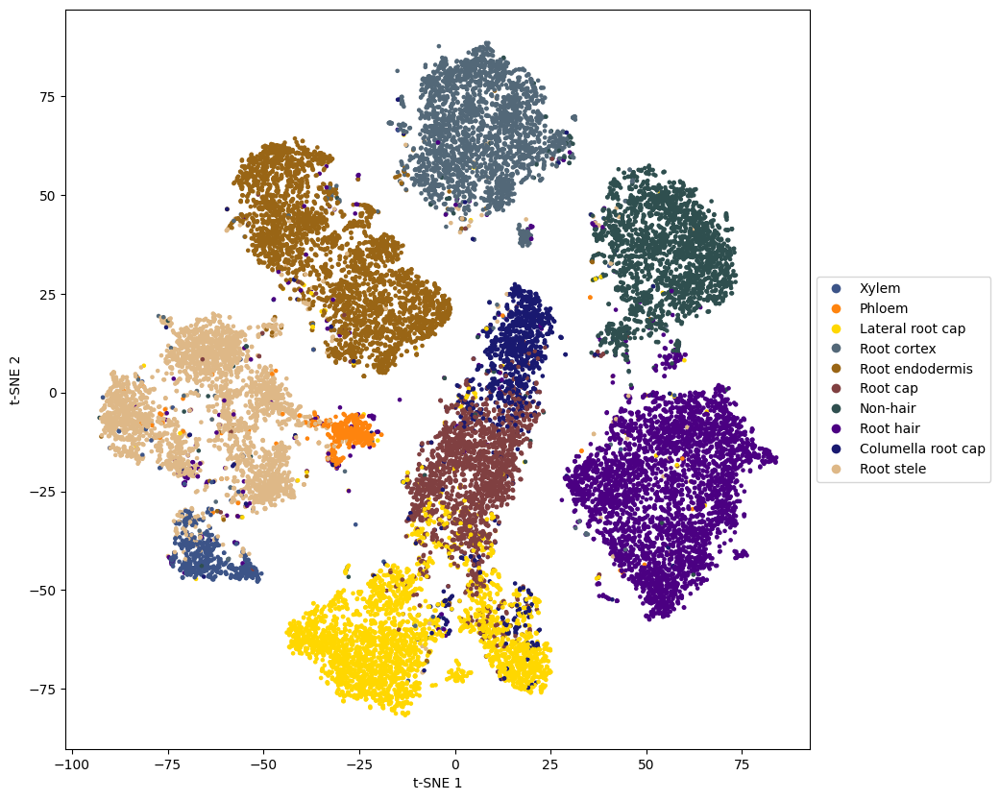

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/celltype_label_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/celltype_label_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/leiden_labels_embedding_Tsne


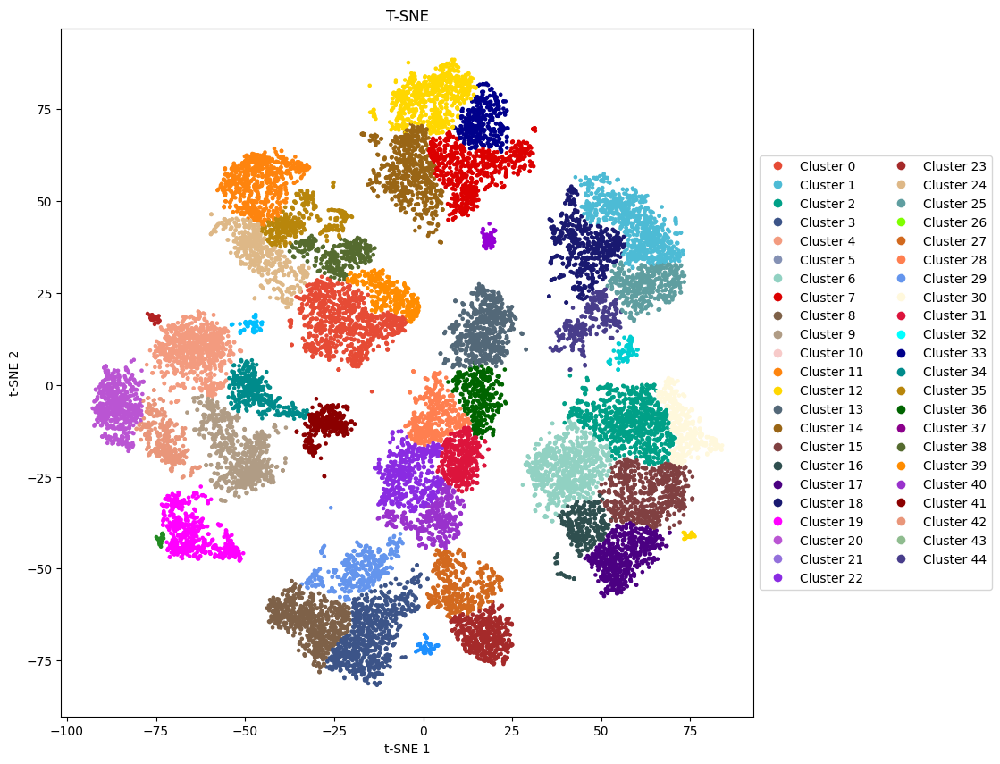

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/leiden_labels_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/leiden_labels_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne


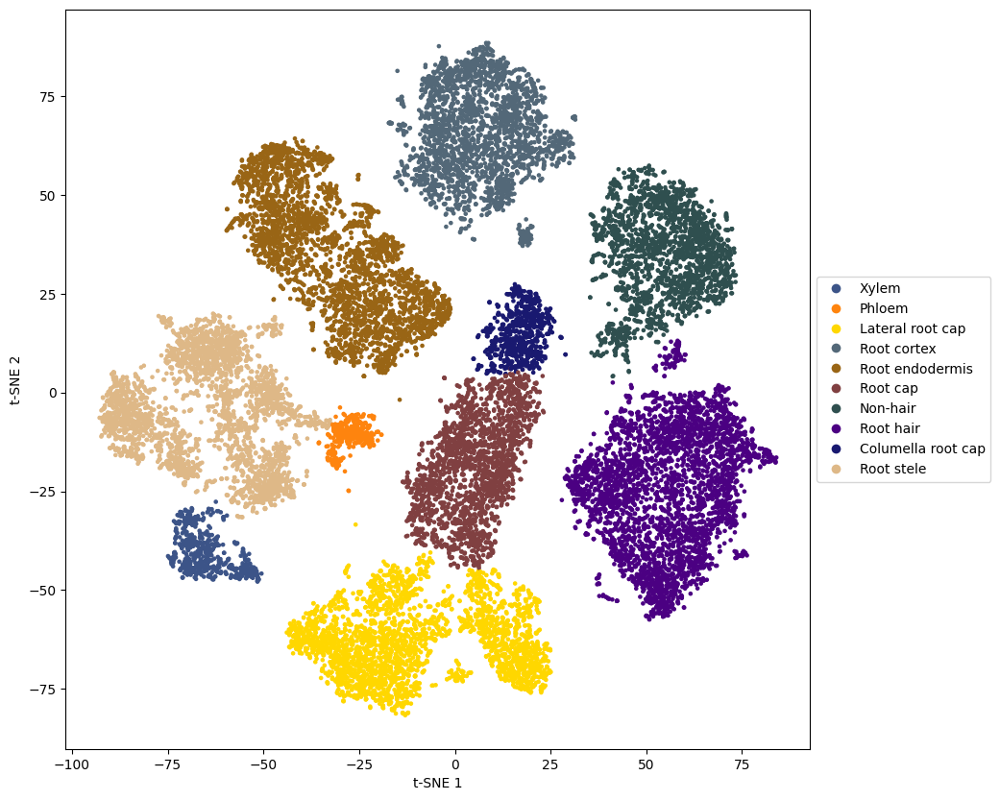

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/batch_Tsne


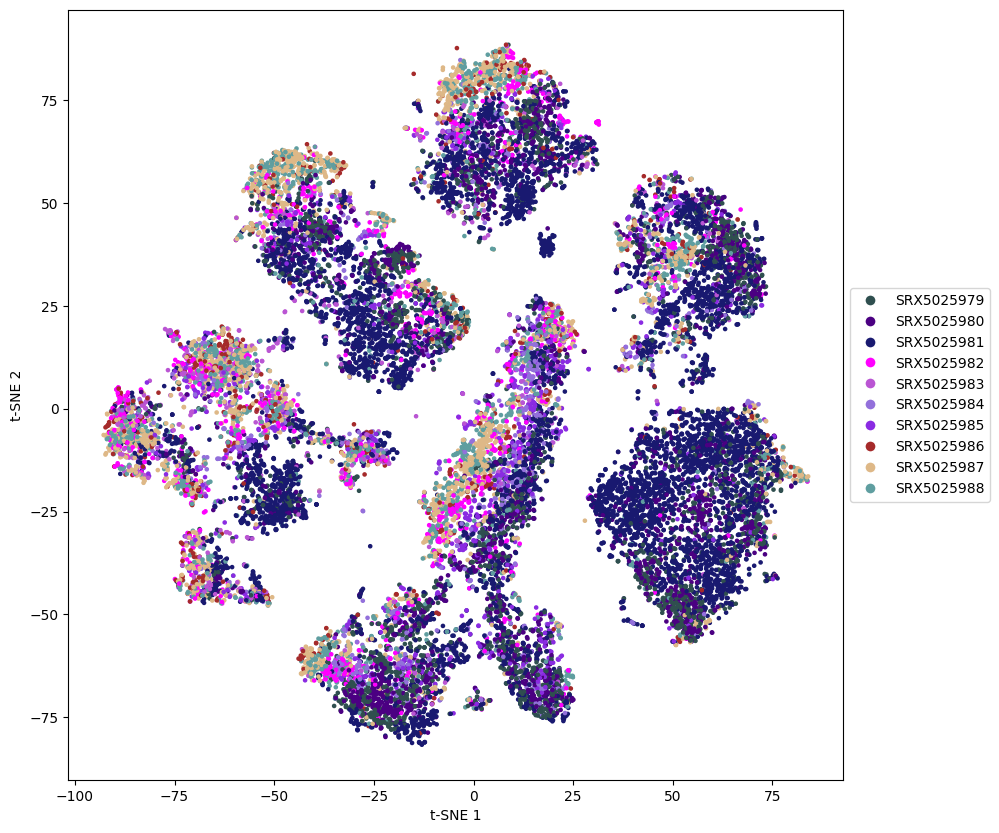

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/batch_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding/batch_Tsne_legend.pdf


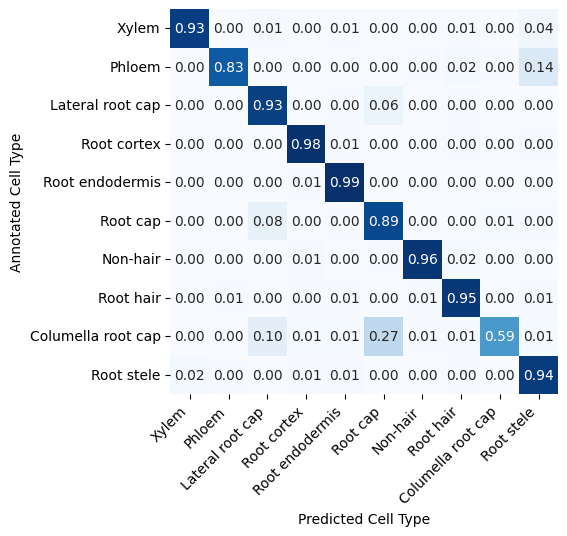

In [38]:
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_finetuned_embedding'
draw_result(ara_test_finetune_tsne_embeddings, ara_test_finetune_result_df, ara_celltype_vocab, celltype_color_mapping, batch_effect_vocab, batch_color_mapping, save_path)

## Ara_test finetuned using unfinetuned embedding

Directory already exists: /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/celltype_label_embedding_Tsne


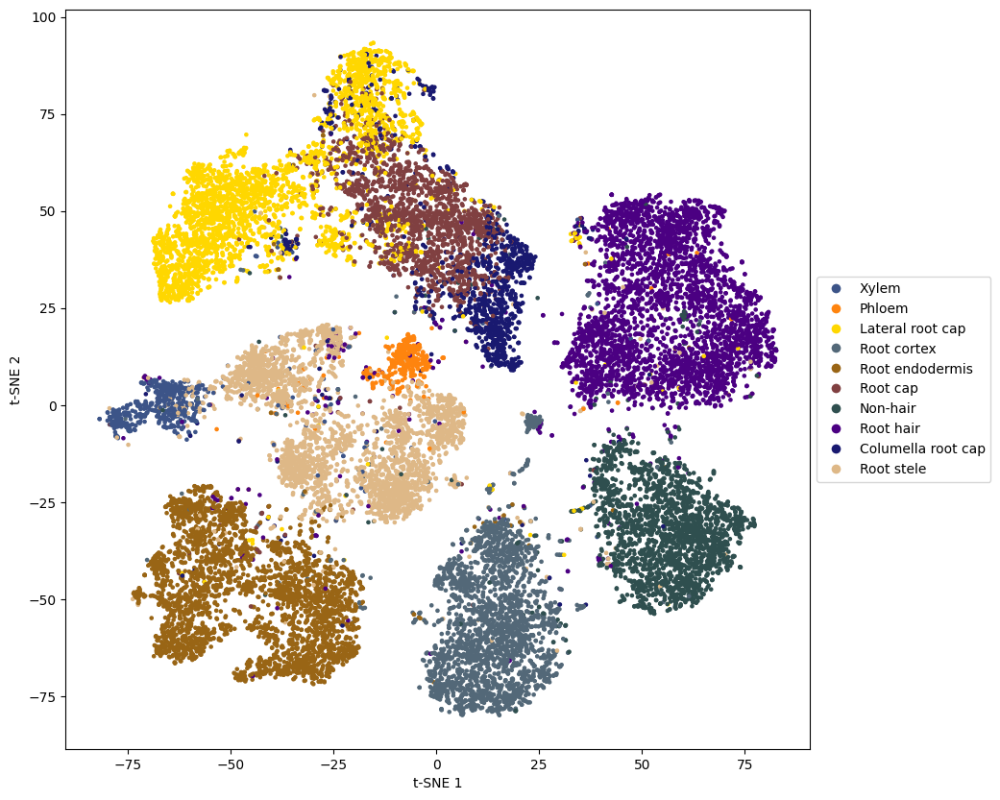

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/celltype_label_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/celltype_label_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/leiden_labels_embedding_Tsne


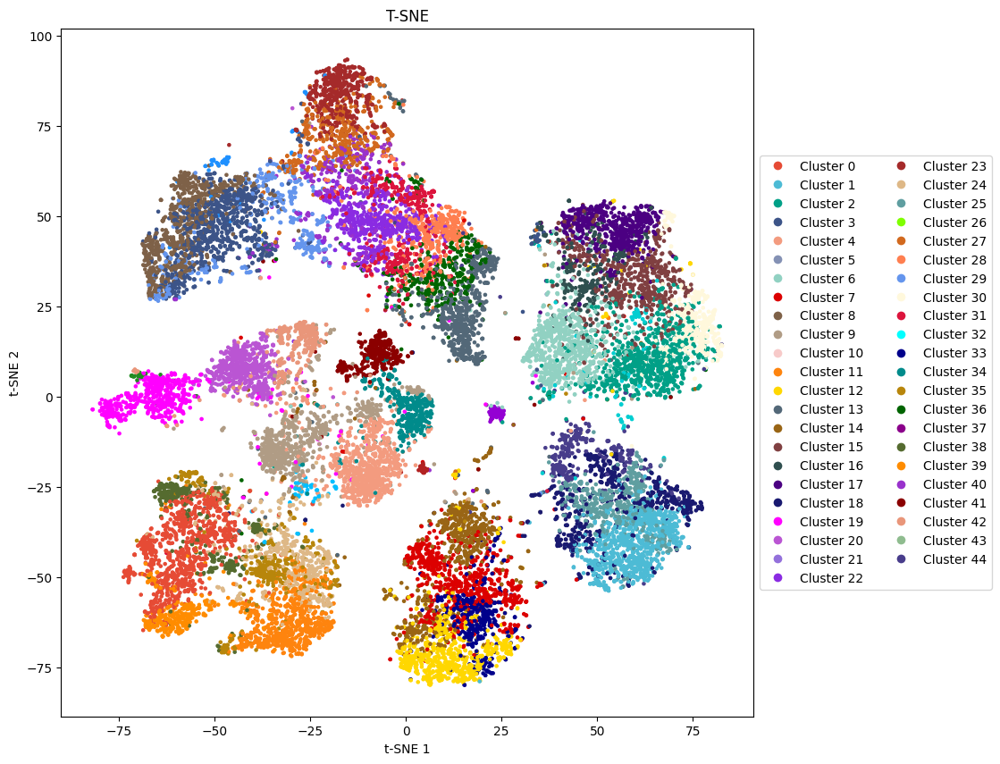

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/leiden_labels_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/leiden_labels_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne


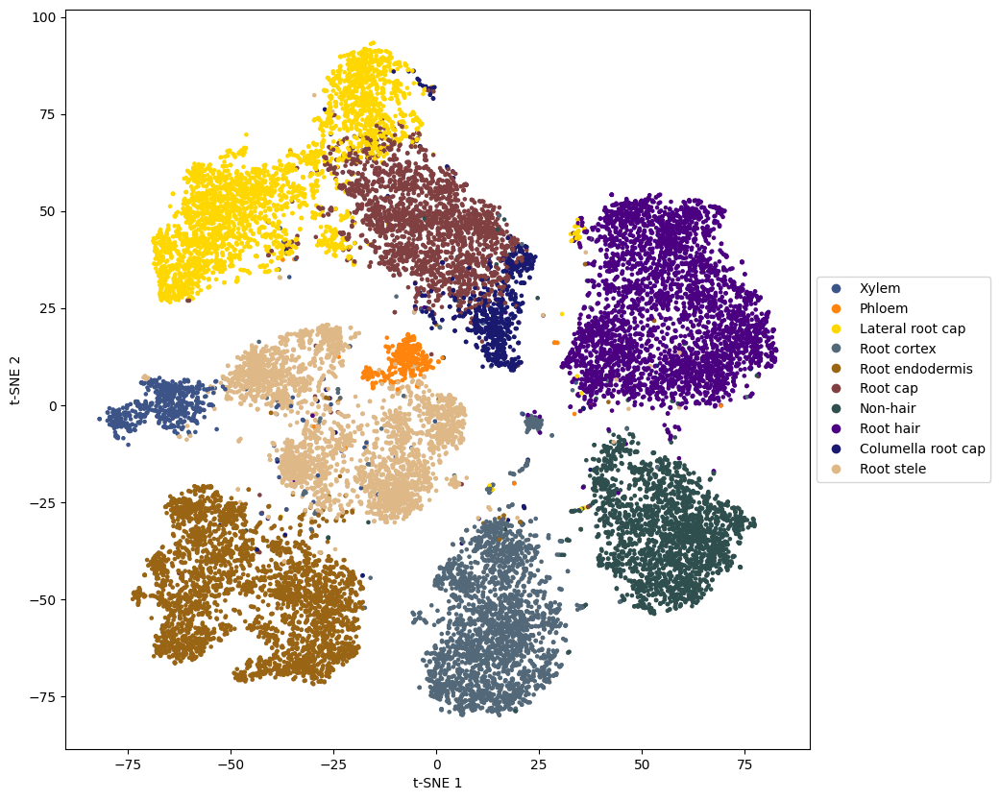

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/batch_Tsne


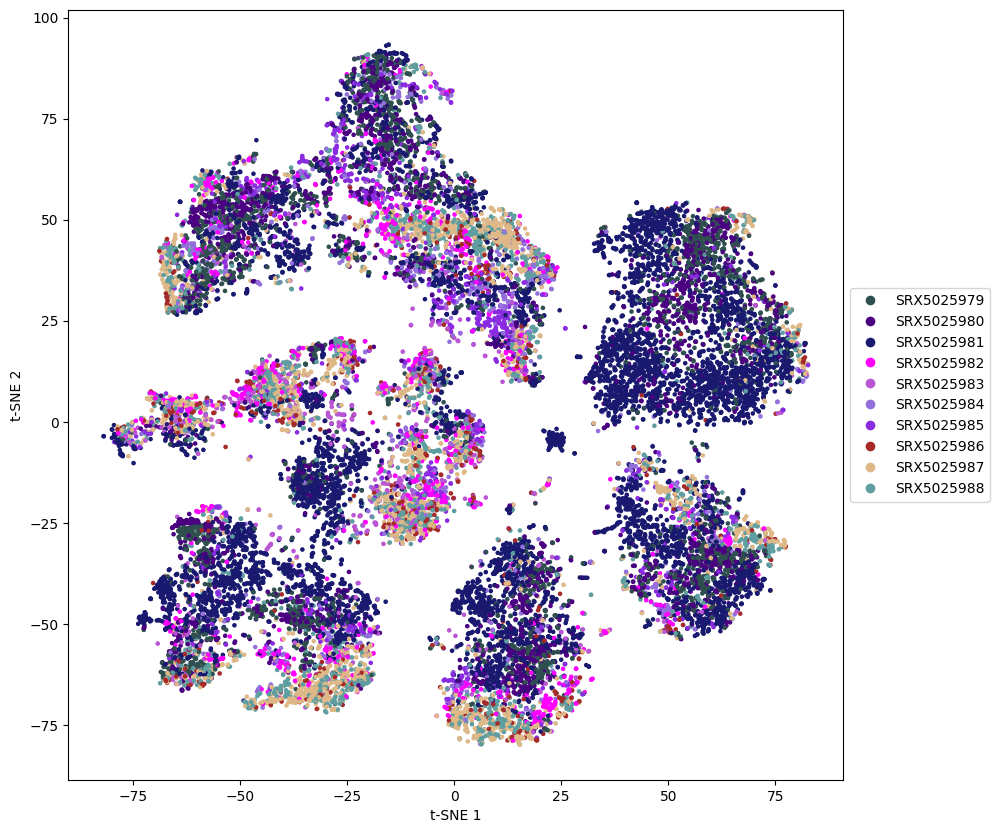

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/batch_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding/batch_Tsne_legend.pdf


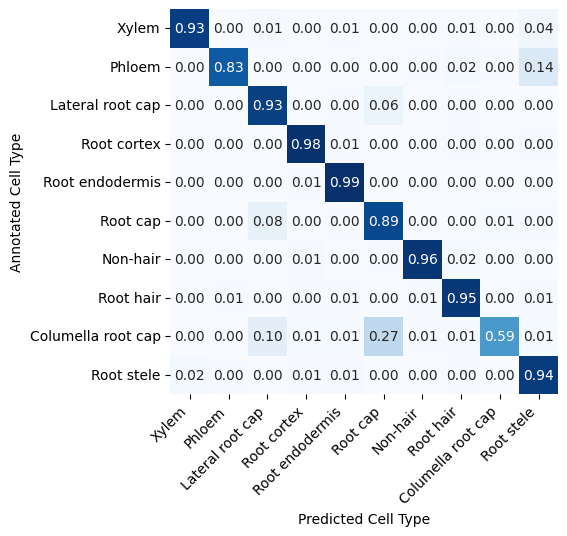

In [39]:
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result/Ara_test/finetune_using_unfinetuned_embedding'
draw_result(ara_test_unfinetune_tsne_embeddings, ara_test_finetune_result_df, ara_celltype_vocab, celltype_color_mapping, batch_effect_vocab, batch_color_mapping, save_path)

In [40]:
result_path = f'{project_path}/s03_scPlantGPT/result/clean_label/scAraGPT'
save_path = f'{project_path}/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune'
with open(f'{result_path}/Ara_test/Ara/tsne_embeddings_finetune_False_Ara.pkl', 'rb') as f:
    tsne_embeddings = pickle.load(f)

result_df = pd.read_csv(f"{result_path}/Ara_test/Ara/Ara_finetune_False_predict_results_best_model_category_8_2024Y08M18D12H54M09S.pth.csv")

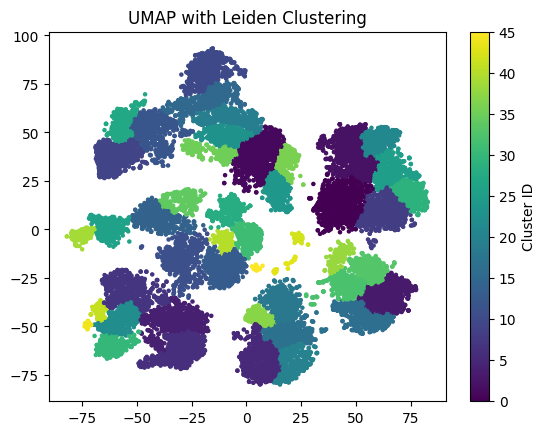

In [41]:
labels, silhouette_avg = cluster_umap_embeddings(tsne_embeddings, n_neighbors=20, method='leiden', resolution=0.8)
result_df['leiden_labels'] = labels

cluster_annotation_label = assign_labels_to_clusters(result_df['leiden_labels'], result_df['cell_types_predictions'])
result_df['cluster_annotation_label'] = cluster_annotation_label

save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_label_embedding_Tsne


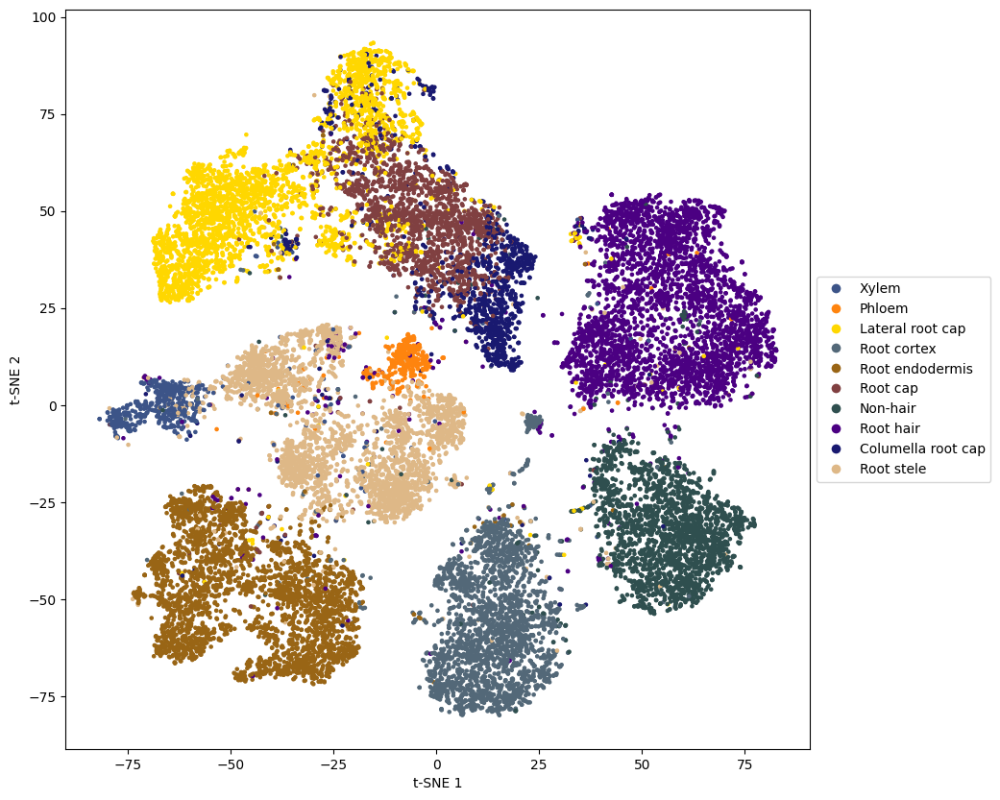

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_label_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_label_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_predict_embedding_Tsne


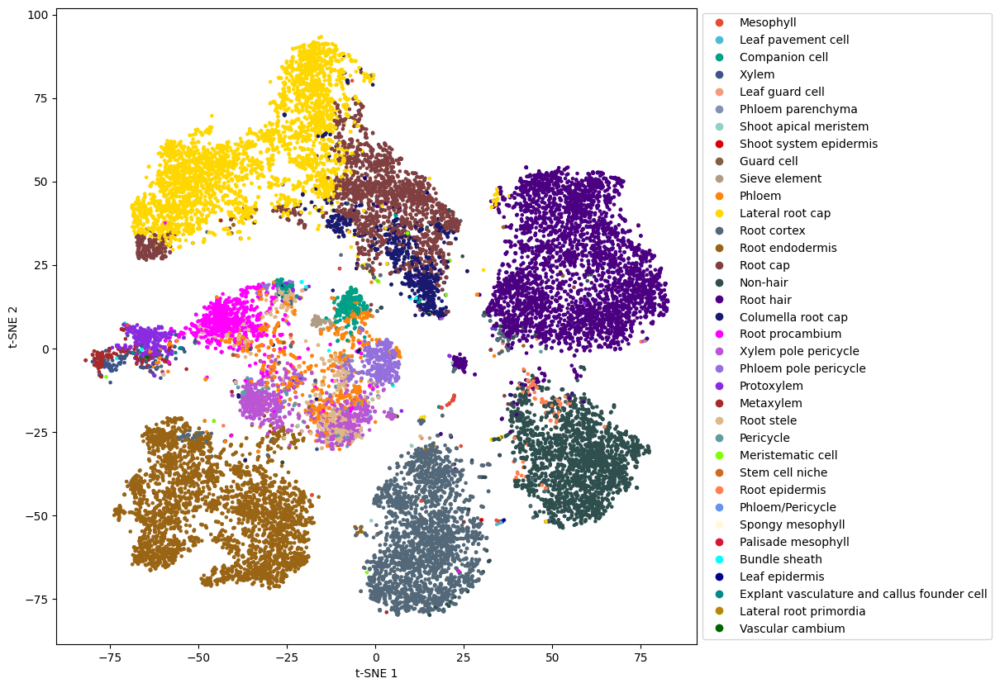

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_predict_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_predict_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_leiden_labels_embedding_Tsne


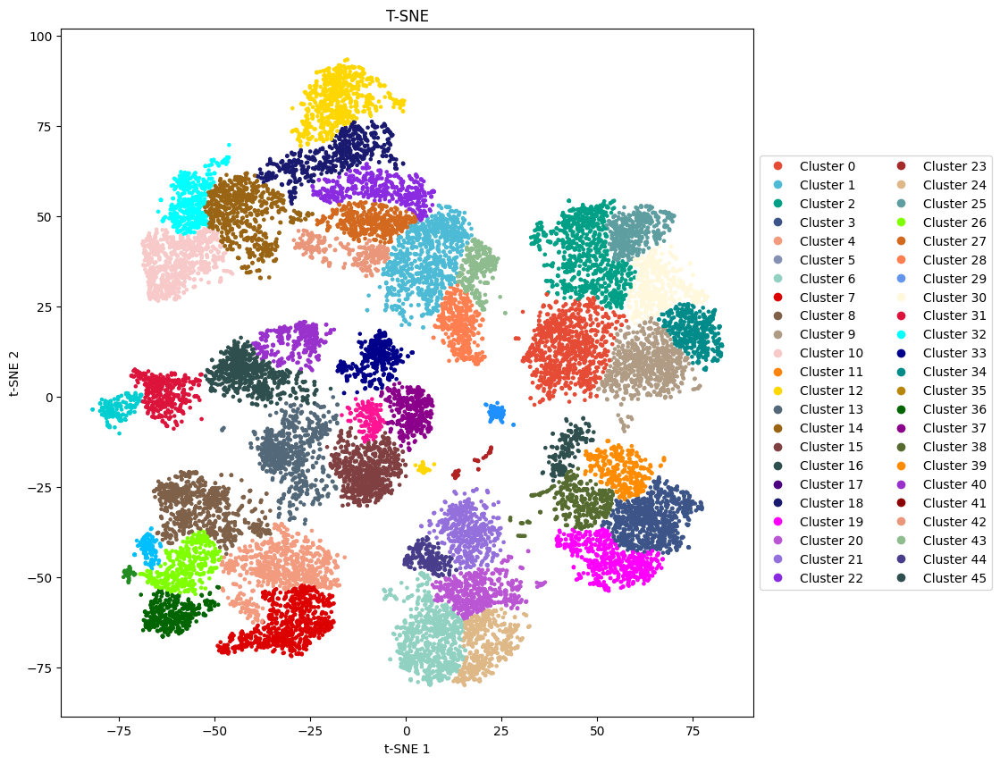

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f1d15d8fd50>>
Traceback (most recent call last):
  File "/mnt/public3/caogs/anaconda3/envs/scPlantGPT/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_leiden_labels_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_leiden_labels_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_cluster_annotation_predict_embedding_Tsne


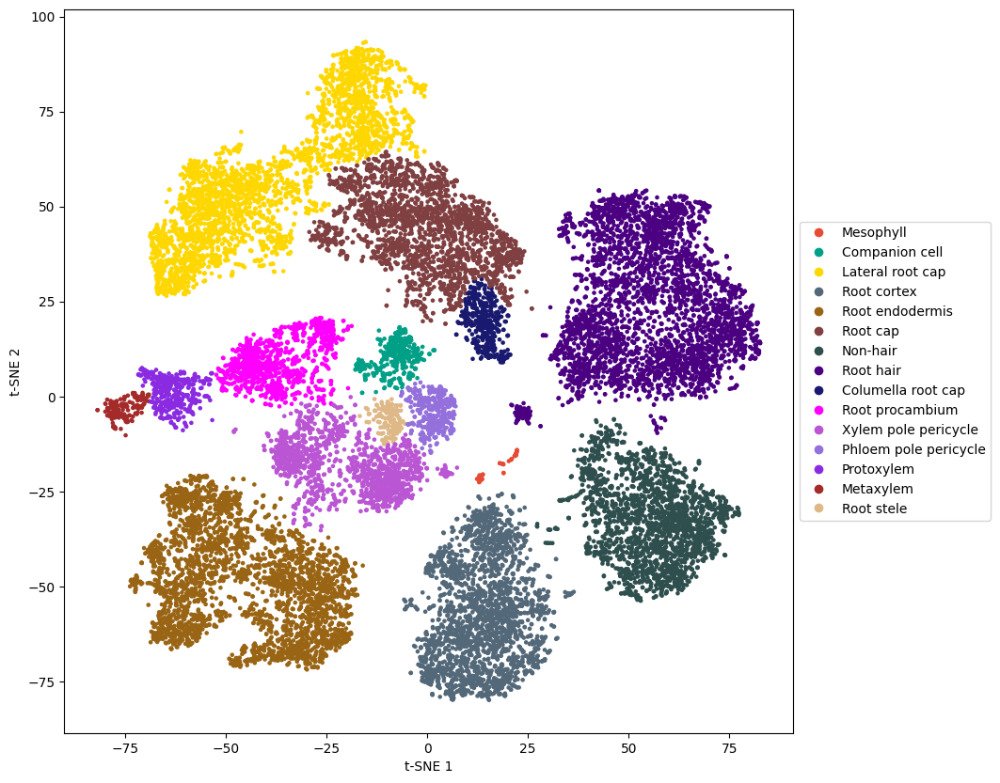

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_celltype_cluster_annotation_predict_embedding_Tsne_legend.pdf
save at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_batch_Tsne


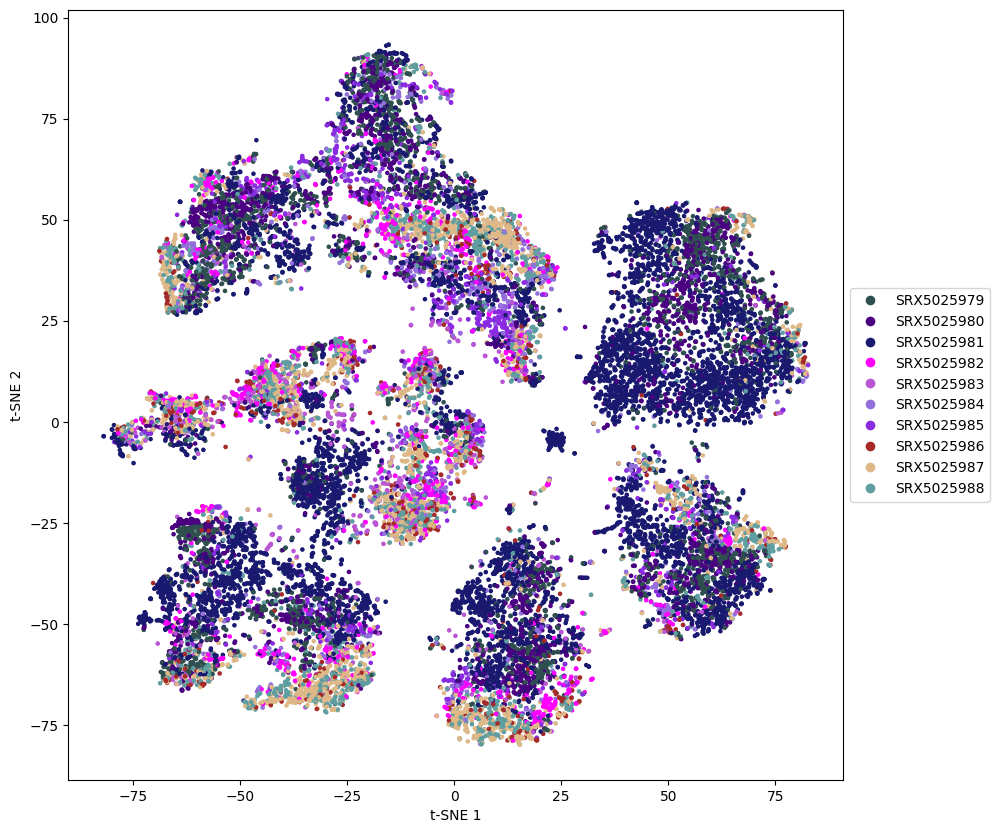

Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_batch_Tsne_legend.pdf
Legend saved at /media/workspace/caoguangshuo/scPlantGPT/s03_scPlantGPT/analysis/plot_result/Ara_test/unfinetune/Ara_test_batch_Tsne_legend.pdf


In [42]:
draw_umap(tsne_embeddings,  result_df['cell_types_labels'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/Ara_test_celltype_label_embedding_Tsne", label_clusters=False)

draw_umap(tsne_embeddings,  result_df['cell_types_predictions'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/Ara_test_celltype_predict_embedding_Tsne", label_clusters=False)

draw_cluster(tsne_embeddings,  result_df['leiden_labels'], 'T-SNE', method='t-SNE', save_name=f"{save_path}/Ara_test_leiden_labels_embedding_Tsne", label_clusters=False)

draw_umap(tsne_embeddings,  result_df['cluster_annotation_label'], ara_celltype_vocab, celltype_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/Ara_test_celltype_cluster_annotation_predict_embedding_Tsne", label_clusters=False)

draw_umap(tsne_embeddings,  result_df['batch_labels'], batch_effect_vocab, batch_color_mapping, 'T-SNE', method='t-SNE', save_name=f"{save_path}/Ara_test_batch_Tsne", label_clusters=False)